<a href="https://colab.research.google.com/github/Syed8855/Titanic_Dataset_Profile_Repo/blob/main/Real_World_Computer_Vision__Building_a_Real_Time_O.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.
import kagglehub
jessicali9530_celeba_dataset_path = kagglehub.dataset_download('jessicali9530/celeba-dataset')

print('Data source import complete.')


# Image Super-Resolution using U-Net

This notebook demonstrates how to build and train a U-Net model for image super-resolution.  
The goal is to take a low-resolution image (64x64) and generate a high-resolution version (256x256).

The U-Net architecture is well-suited for this task as it effectively captures both local and global features through its encoder-decoder structure with skip connections.



### 1. Setup and Imports

This cell imports all the necessary libraries for building and training the U-Net model, including Keras for model definition, OpenCV for image processing, and Matplotlib for visualization.

In [ ]:
import os
import cv2 as cv
import numpy as np

import matplotlib.pyplot as plt

from keras.models import Model, load_model
from keras.layers import Input, BatchNormalization, Activation, Dense, Dropout
from keras.layers import Conv2D, Conv2DTranspose
from keras.layers import MaxPooling2D, GlobalMaxPool2D
from keras.layers import concatenate
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from keras.optimizers import Adam
import tensorflow as tf

### 2. U-Net Model Definition

This cell defines the U-Net model architecture for image super-resolution. The `unet_64to128` function creates a U-Net model that takes a 64x64x3 image as input and outputs a 256x256x3 image. It includes an encoder, a bottleneck, and a decoder with skip connections.

In [ ]:
def unet_64to256(input_shape=(64, 64, 3), n_classes=3, final_activation='sigmoid', dropout_rate=0.05):
    inputs = Input(shape=input_shape, name='img')

    # Encoder (This part stays exactly the same)
    c1 = Conv2D(16, (3,3), padding='same')(inputs); c1 = BatchNormalization()(c1); c1 = Activation('relu')(c1); c1 = Conv2D(16, (3,3), padding='same')(c1); c1 = BatchNormalization()(c1); c1 = Activation('relu')(c1); p1 = MaxPooling2D((2,2))(c1)
    c2 = Conv2D(32, (3,3), padding='same')(p1); c2 = BatchNormalization()(c2); c2 = Activation('relu')(c2); c2 = Conv2D(32, (3,3), padding='same')(c2); c2 = BatchNormalization()(c2); c2 = Activation('relu')(c2); p2 = MaxPooling2D((2,2))(c2)
    c3 = Conv2D(64, (3,3), padding='same')(p2); c3 = BatchNormalization()(c3); c3 = Activation('relu')(c3); c3 = Conv2D(64, (3,3), padding='same')(c3); c3 = BatchNormalization()(c3); c3 = Activation('relu')(c3); p3 = MaxPooling2D((2,2))(c3)
    c4 = Conv2D(128, (3,3), padding='same')(p3); c4 = BatchNormalization()(c4); c4 = Activation('relu')(c4); c4 = Conv2D(128, (3,3), padding='same')(c4); c4 = BatchNormalization()(c4); c4 = Activation('relu')(c4); p4 = MaxPooling2D((2,2))(c4)

    # Bottleneck
    c5 = Conv2D(256, (3,3), padding='same')(p4); c5 = BatchNormalization()(c5); c5 = Activation('relu')(c5); c5 = Conv2D(256, (3,3), padding='same')(c5); c5 = BatchNormalization()(c5); c5 = Activation('relu')(c5)

    # Decoder (This part also stays the same until the very end)
    u6 = Conv2DTranspose(128, (2,2), strides=(2,2), padding='same')(c5); u6 = concatenate([u6, c4])
    c6 = Conv2D(128, (3,3), padding='same')(u6); c6 = BatchNormalization()(c6); c6 = Activation('relu')(c6); c6 = Conv2D(128, (3,3), padding='same')(c6); c6 = BatchNormalization()(c6); c6 = Activation('relu')(c6)
    u7 = Conv2DTranspose(64, (2,2), strides=(2,2), padding='same')(c6); u7 = concatenate([u7, c3])
    c7 = Conv2D(64, (3,3), padding='same')(u7); c7 = BatchNormalization()(c7); c7 = Activation('relu')(c7); c7 = Conv2D(64, (3,3), padding='same')(c7); c7 = BatchNormalization()(c7); c7 = Activation('relu')(c7)
    u8 = Conv2DTranspose(32, (2,2), strides=(2,2), padding='same')(c7); u8 = concatenate([u8, c2])
    c8 = Conv2D(32, (3,3), padding='same')(u8); c8 = BatchNormalization()(c8); c8 = Activation('relu')(c8); c8 = Conv2D(32, (3,3), padding='same')(c8); c8 = BatchNormalization()(c8); c8 = Activation('relu')(c8)
    u9 = Conv2DTranspose(16, (2,2), strides=(2,2), padding='same')(c8); u9 = concatenate([u9, c1])
    c9 = Conv2D(16, (3,3), padding='same')(u9); c9 = BatchNormalization()(c9); c9 = Activation('relu')(c9); c9 = Conv2D(16, (3,3), padding='same')(c9); c9 = BatchNormalization()(c9); c9 = Activation('relu')(c9)

    # upsampling layer to go from 64x64 -> 128x128
    u10 = Conv2DTranspose(16, (2,2), strides=(2,2), padding='same')(c9)
    # final upsampling layer to go from 128x128 -> 256x256
    u11 = Conv2DTranspose(16, (2,2), strides=(2,2), padding='same')(u10)

    outputs = Conv2D(n_classes, (1,1), padding='same', activation=final_activation)(u11)

    model = Model(inputs, outputs, name='UNet-64to256')
    return model

### 3. Model Initialization and Compilation

This cell initializes the U-Net model with the specified input shape and number of classes. It then compiles the model using the Adam optimizer and mean absolute error (MAE) as the loss function. The input and output shapes are printed to verify the model architecture.

In [ ]:
model = unet_64to256(input_shape=(64,64,3), n_classes=3, final_activation='sigmoid')

print('Input shape:', model.input_shape)   # (None, 64, 64, 3)
print('Output shape:', model.output_shape) # (None, 256, 256, 3)

model.compile(optimizer=Adam(1e-4), loss='mae' )

Input shape: (None, 64, 64, 3)
Output shape: (None, 256, 256, 3)


### 4. Data Generator

This cell defines a data generator function `datagen` that loads and preprocesses images from the CelebA dataset. It resizes the images to 256x256 as ground truth and to 64x64 as low-resolution input, and normalizes the pixel values. The generator yields batches of low-resolution and high-resolution image pairs for training.

In [ ]:
import os

img_folder = "/kaggle/input/img_align_celeba/img_align_celeba"
imgs = [f for f in os.listdir(img_folder) if f.endswith(".jpg")]

print(len(imgs))       # Should be ~200k
print(imgs[:5])        # See first 5 files


202599
['083648.jpg', '168202.jpg', '125778.jpg', '059339.jpg', '032501.jpg']


In [ ]:
import os
import cv2 as cv
import numpy as np

# Correct path to images folder
img_folder = "/kaggle/input/img_align_celeba/img_align_celeba"
imgs = os.listdir(img_folder)

def datagen(batch_size):
    while True:
        x_batch = []
        y_batch = []

        for _ in range(batch_size):
            indx = np.random.randint(0, len(imgs))
            img_path = os.path.join(img_folder, imgs[indx])  # <-- safe concatenation

            bgr = cv.imread(img_path)
            if bgr is None:
                continue  # skip if image failed to load

            bgr = cv.resize(bgr, (256, 256))
            rgb = cv.cvtColor(bgr, cv.COLOR_BGR2RGB)

            x = cv.resize(rgb, (64, 64)) / 255.0
            y = rgb / 255.0

            x_batch.append(x)
            y_batch.append(y)

        x_batch = np.array(x_batch).reshape(batch_size, 64, 64, 3)
        y_batch = np.array(y_batch).reshape(batch_size, 256, 256, 3)

        yield x_batch, y_batch


### 5. Model Training (Short Run)

This cell trains the U-Net model for a small number of epochs (5) using the `datagen` function. This is a short run to quickly check if the model is training without errors.

In [ ]:
batch_size = 32

batch_size = 32
num_images = len(imgs)
steps_per_epoch = num_images // batch_size


results = model.fit(datagen(batch_size=batch_size), steps_per_epoch=100 , epochs=5, verbose=1)

Epoch 1/5
100/100 ━━━━━━━━━━━━━━━━━━━━ 28s 281ms/step - loss: 0.2324
Epoch 2/5
100/100 ━━━━━━━━━━━━━━━━━━━━ 29s 287ms/step - loss: 0.1682
Epoch 3/5
100/100 ━━━━━━━━━━━━━━━━━━━━ 28s 276ms/step - loss: 0.1131
Epoch 4/5
100/100 ━━━━━━━━━━━━━━━━━━━━ 28s 275ms/step - loss: 0.0816
Epoch 5/5
100/100 ━━━━━━━━━━━━━━━━━━━━ 28s 281ms/step - loss: 0.0704


### 6. Model Training with Callbacks and Sample Saving

This cell trains the U-Net model for a longer duration (3 epochs) and includes custom callbacks. The `show_and_save_samples` function generates and saves sample super-resolved images at the end of each epoch, along with the original, ground truth, and low-resolution images for comparison. The `LambdaCallback` is used to execute this function after each epoch. The model checkpoints are also saved during training.

Epoch 1/3
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - loss: 0.0432

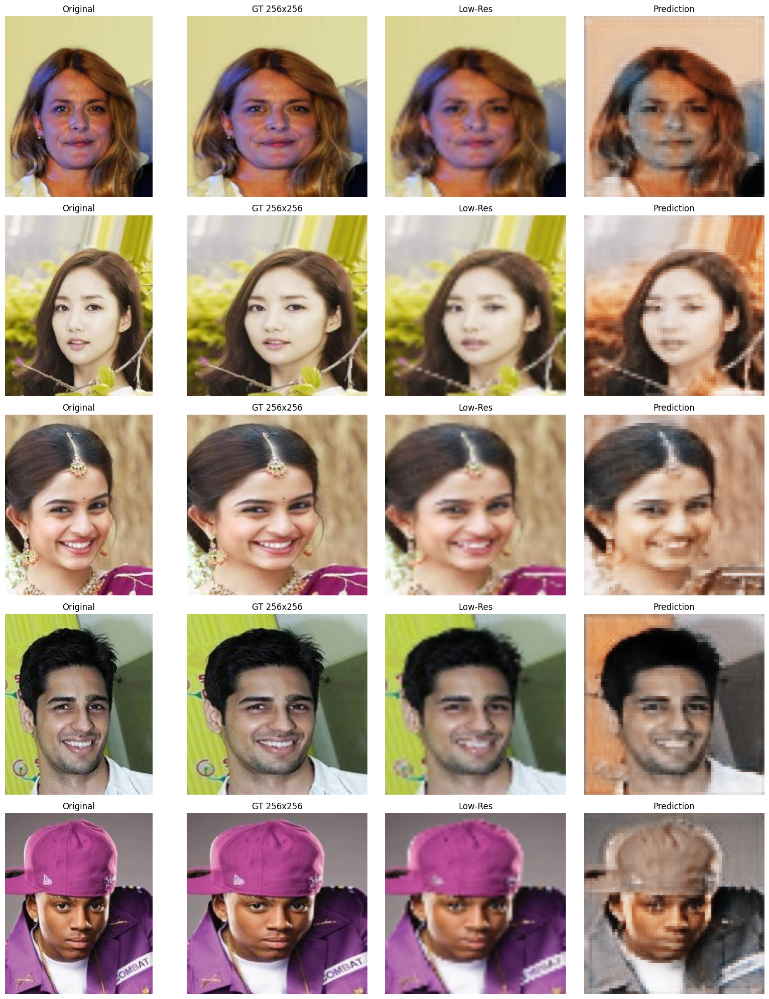

200/200 ━━━━━━━━━━━━━━━━━━━━ 256s 1s/step - loss: 0.0432
Epoch 2/3
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - loss: 0.0400

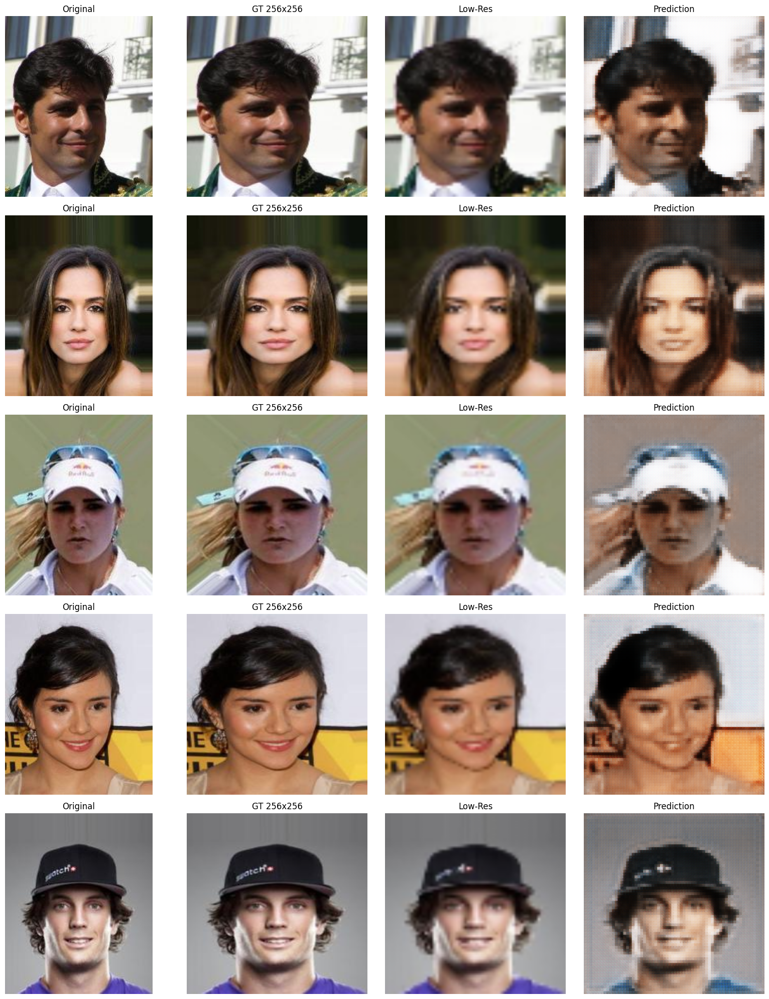

200/200 ━━━━━━━━━━━━━━━━━━━━ 253s 1s/step - loss: 0.0400
Epoch 3/3
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - loss: 0.0389

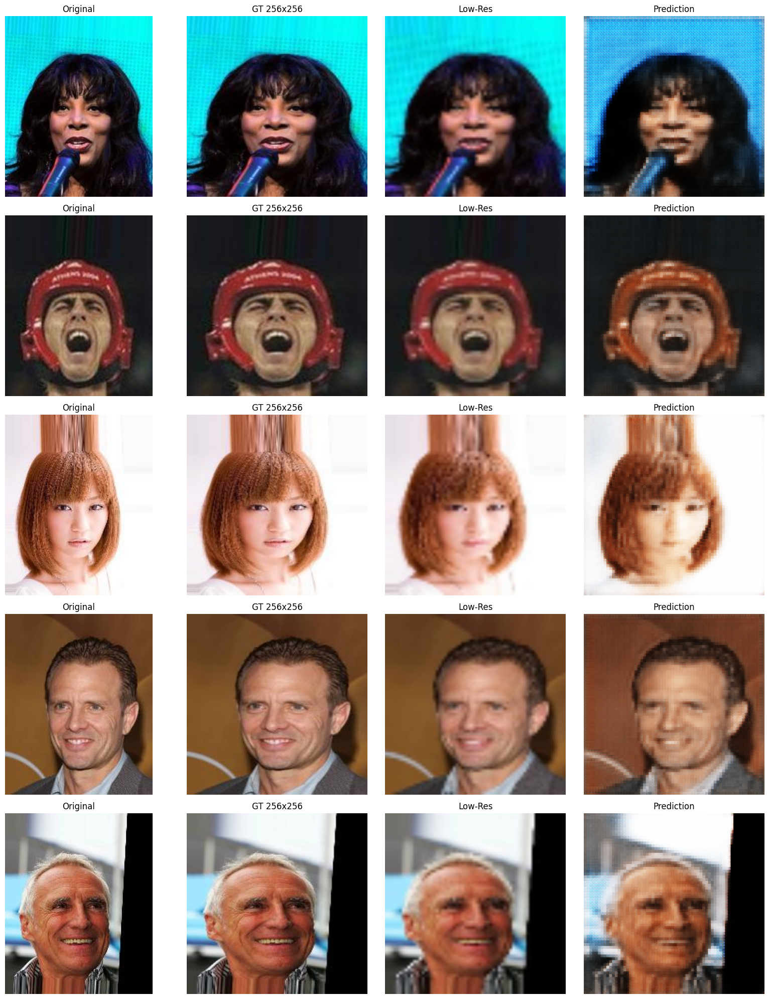

200/200 ━━━━━━━━━━━━━━━━━━━━ 256s 1s/step - loss: 0.0389


In [ ]:
import os, cv2 as cv, numpy as np, matplotlib.pyplot as plt, tensorflow as tf

def show_and_save_samples(model, imgs, base_dir, epoch, n=5, save_dir='./epoch_samples'):
    os.makedirs(save_dir, exist_ok=True)
    chosen = np.random.choice(imgs, n, replace=False)
    fig, axes = plt.subplots(n, 4, figsize=(16, 4*n))
    if n == 1: axes = np.expand_dims(axes, 0)

    for i, fname in enumerate(chosen):
        path = os.path.join(base_dir, fname)
        bgr = cv.imread(path)
        if bgr is None:
            print("Skipping unreadable image:", path)
            continue  # <-- added safety check

        rgb = cv.cvtColor(bgr, cv.COLOR_BGR2RGB)
        gt128 = cv.resize(rgb, (256,256)).astype('float32')/255
        img64 = cv.resize(rgb, (64,64)).astype('float32')/255
        pred  = model.predict(np.expand_dims(img64,0), verbose=0)[0]
        lowup = cv.resize((img64*255).astype(np.uint8),(256,256))

        for ax, im, title in zip(axes[i],[rgb,gt128,lowup,pred],
                                 ['Original','GT 256x256','Low-Res','Prediction']):
            ax.imshow(im); ax.set_title(title); ax.axis('off')

    plt.tight_layout()
    plt.savefig(f"{save_dir}/epoch_{epoch+1:02d}.png")
    plt.show()

# --- Simple Callbacks ---
def on_epoch_end(epoch, logs):
    show_and_save_samples(model, imgs, base_dir, epoch, n=5)
    model.save(f'./checkpoints/model_epoch_{epoch+1:02d}.keras')

show_cb = tf.keras.callbacks.LambdaCallback(on_epoch_end=on_epoch_end)

# Ensure imgs contains only readable image files
base_dir = '/kaggle/input/img_align_celeba/img_align_celeba/'
imgs = [f for f in os.listdir(base_dir) if f.endswith('.jpg')]

batch_size = 32
steps_per_epoch = len(imgs)//batch_size
os.makedirs('./checkpoints', exist_ok=True)

results = model.fit(
    datagen(batch_size=batch_size),
    steps_per_epoch=200,
    epochs=3,
    callbacks=[show_cb],
    verbose=1
)


### 7. Project Summary

This notebook successfully implemented and trained a U-Net model for image super-resolution. The model was trained on the CelebA dataset, taking 64x64 images as input and generating 256x256 images.

The training process showed a decrease in the mean absolute error (MAE) loss over epochs, indicating that the model is learning to reconstruct higher-resolution images. The generated sample images at the end of each epoch provide a visual representation of the model's progress.

Further improvements could include:
- Experimenting with different loss functions (e.g., perceptual loss)
- Using a larger and more diverse dataset
- Implementing more advanced super-resolution techniques (e.g., Generative Adversarial Networks)
- Hyperparameter tuning to optimize model performance